# MLP Clustering Analysis

In [1]:
import sys
sys.path.append('..')

import matplotlib.pylab as plt
import pandas as pd
from tqdm import tqdm
from IPython import display

from src.visualization import draw_mlp_clustering_report, run_double_spectral_cluster
from src.utils import get_weights_paths, build_clustering_results
from src.experiment_tagging import get_model_path, MODEL_TAG_LOOKUP
from src.spectral_cluster_model import SHUFFLE_METHODS

Using TensorFlow backend.


In [2]:
clustering_results = {}

model_tags = ('MNIST', 'MNIST+DROPOUT', 'MNIST+L1REG', 'MNIST+MOD-INIT',
              'HALVES-SAME-MNIST', 'HALVES-MNIST',
              'FASHION', 'FASHION+DROPOUT', 'FASHION+L1REG', 'FASHION+MOD-INIT',
              'HALVES-SAME-FASHION', 'HALVES-FASHION',
              'CIFAR10', 'CIFAR10+DROPOUT', 'CIFAR10+L1REG', 'CIFAR10+MOD-INIT',
              'HALVES-SAME-CIFAR10', 'HALVES-CIFAR10')
mlp_model_paths = {model_tag: get_model_path(model_tag) for model_tag in model_tags}

n_clust = 12
n_samples = 50
n_workers = 10

  0%|          | 0/18 [00:00<?, ?it/s]

  6%|▌         | 1/18 [09:28<2:41:10, 568.86s/it]

 11%|█         | 2/18 [18:55<2:31:29, 568.08s/it]

 17%|█▋        | 3/18 [25:27<2:08:50, 515.39s/it]

 22%|██▏       | 4/18 [34:49<2:03:30, 529.32s/it]

 28%|██▊       | 5/18 [47:09<2:08:24, 592.68s/it]

 33%|███▎      | 6/18 [59:50<2:08:36, 643.03s/it]

 39%|███▉      | 7/18 [1:12:53<2:05:34, 684.98s/it]

 44%|████▍     | 8/18 [1:25:52<1:58:52, 713.22s/it]

 50%|█████     | 9/18 [1:36:12<1:42:46, 685.21s/it]

 56%|█████▌    | 10/18 [1:48:15<1:32:52, 696.60s/it]

 61%|██████    | 11/18 [2:00:00<1:21:34, 699.17s/it]

 67%|██████▋   | 12/18 [2:11:55<1:10:23, 703.93s/it]

 72%|███████▏  | 13/18 [2:23:48<58:52, 706.58s/it]  

 78%|███████▊  | 14/18 [2:37:27<49:20, 740.20s/it]

 83%|████████▎ | 15/18 [2:46:11<33:46, 675.36s/it]

 89%|████████▉ | 16/18 [2:58:44<23:17, 698.81s/it]

 94%|█████████▍| 17/18 [3:13:13<12:29, 749.97s/it]

100%|██████████| 18/18 [3:31:08<00:00, 847.39s/it]

100%|██████████| 18/18 [3:31:08<00:00, 703.82s/it]

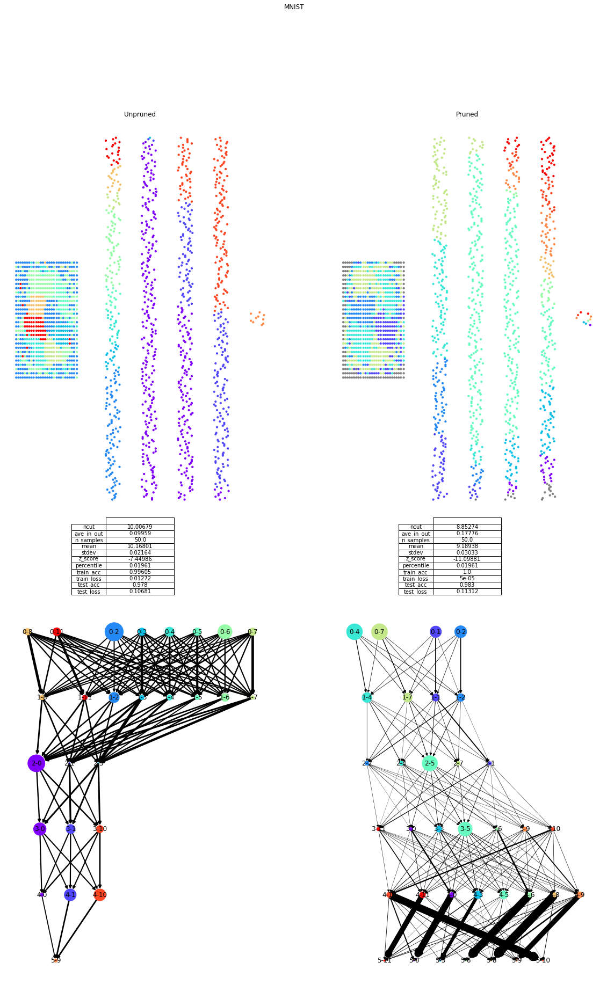

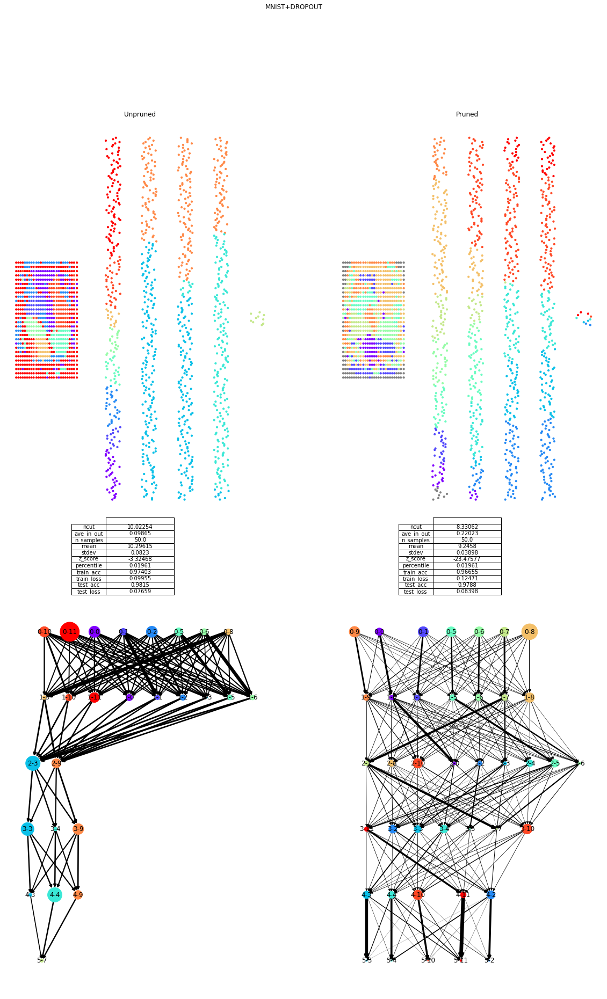

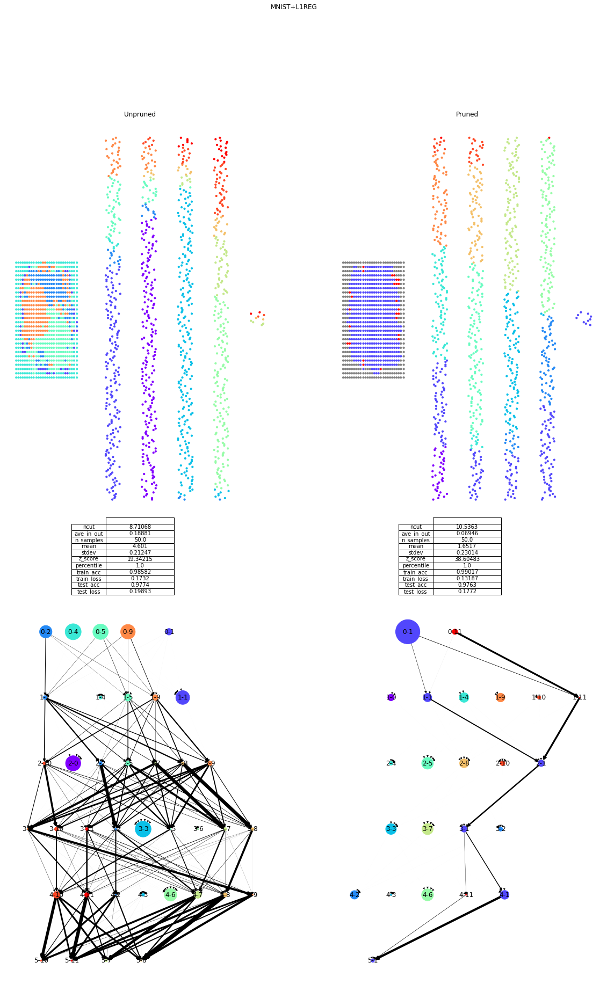

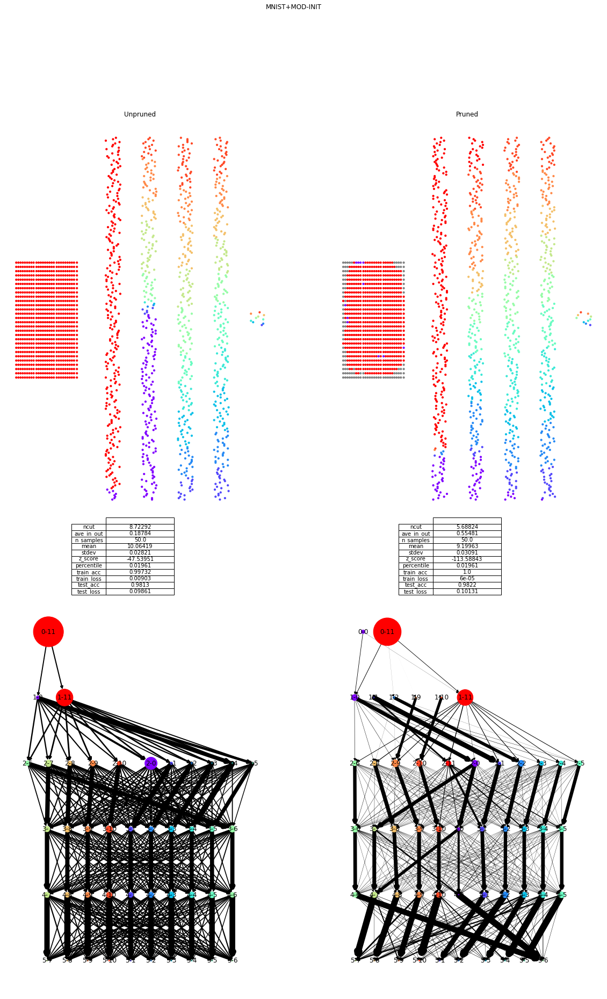

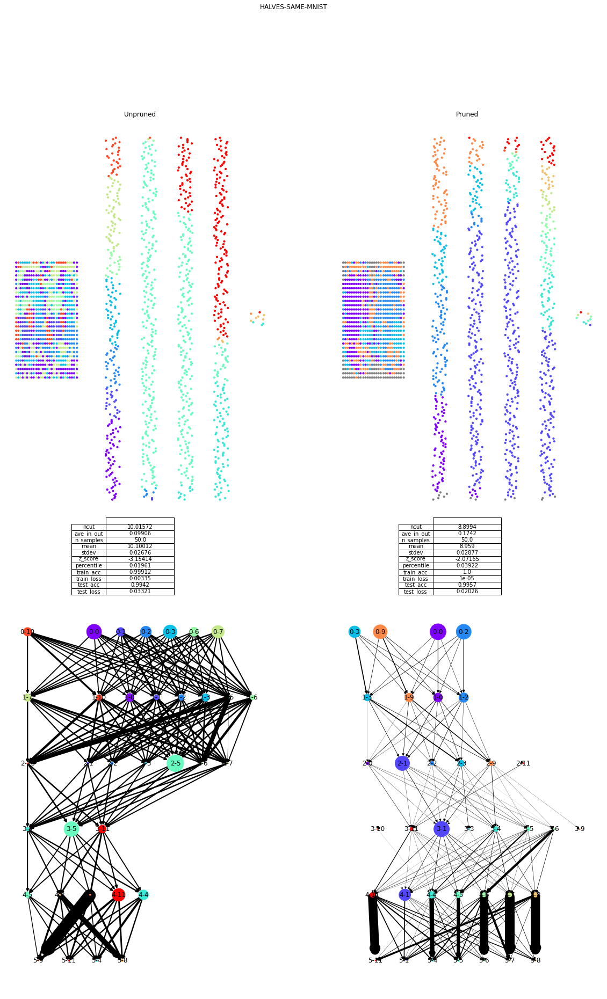

...

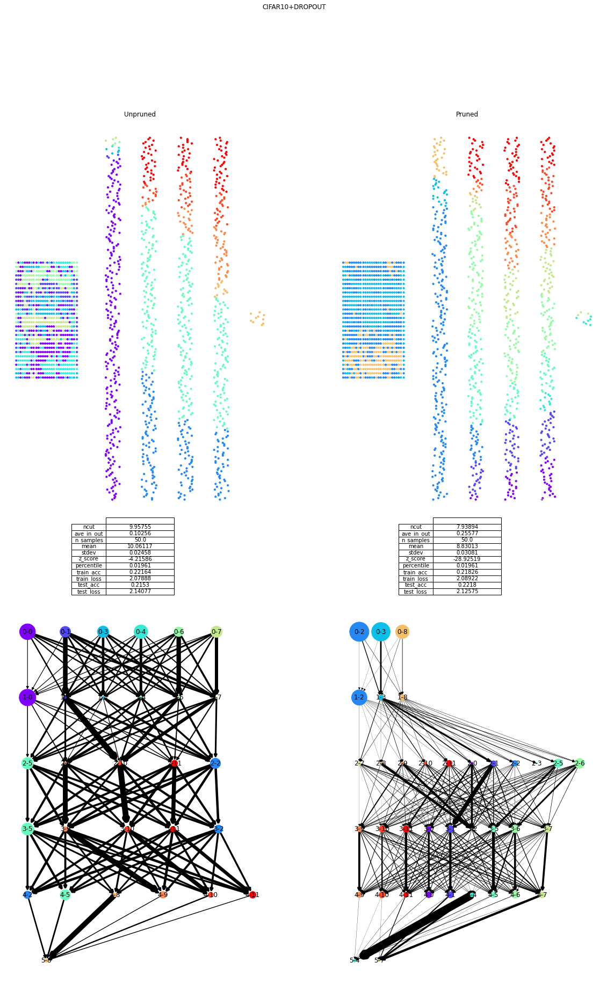

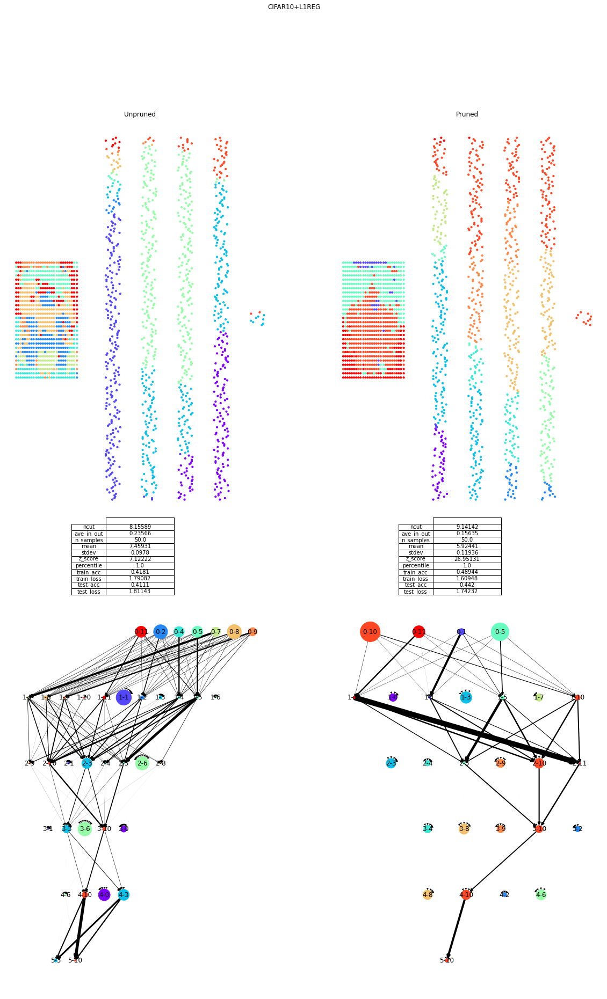

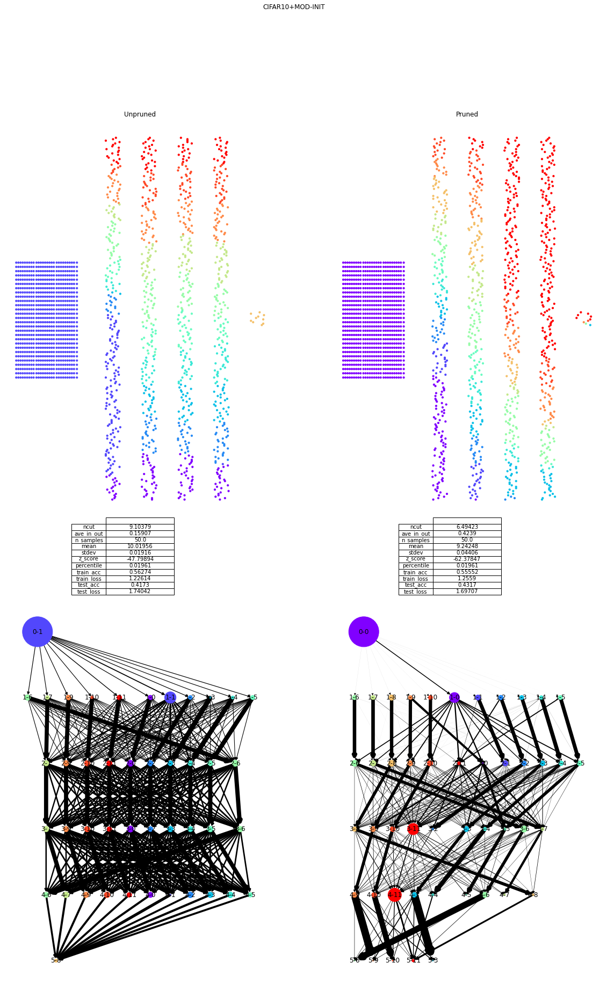

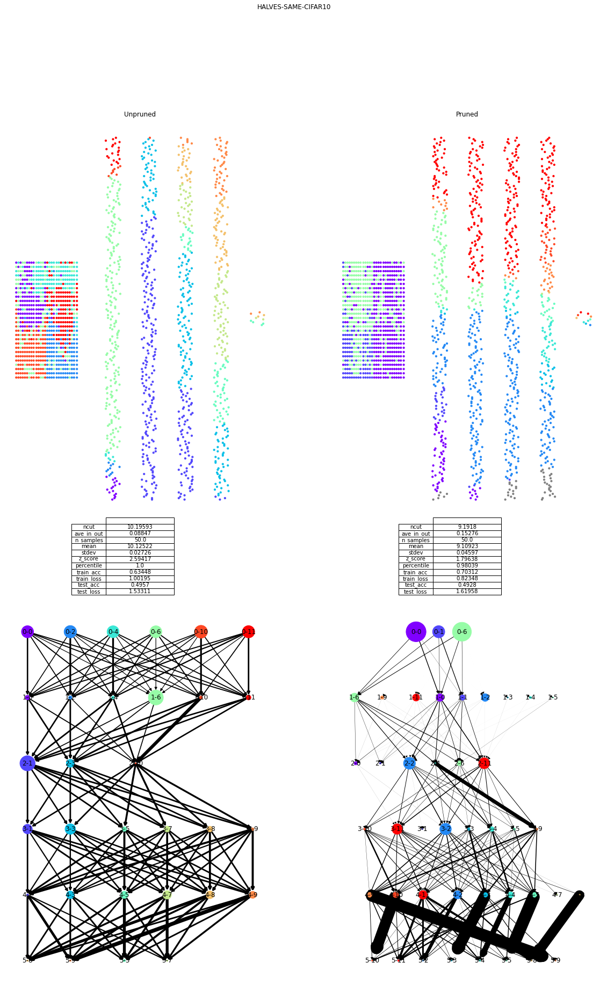

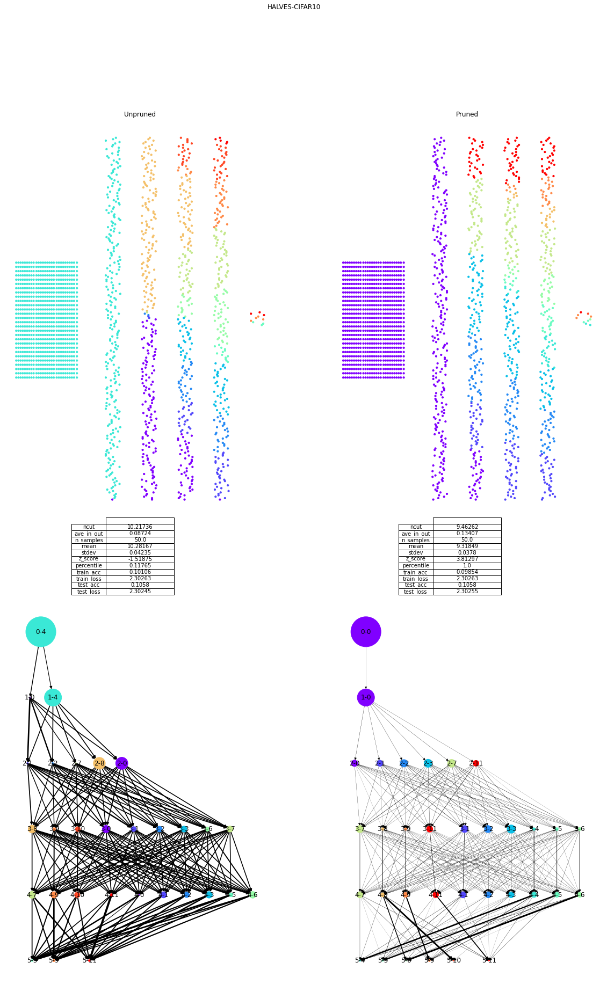

In [3]:
for model_name, path in tqdm(mlp_model_paths.items()):
    
    clustering_results[model_name] = run_double_spectral_cluster(path, n_clusters=n_clust,
                                                                 n_samples=n_samples, n_workers=n_workers)

    draw_mlp_clustering_report(path, clustering_results[model_name], n_cluster=n_clust, title=model_name)
